# Inference with LLaVa, a multimodal LLM

LLaVa is an exciting new multimodal LLM which extends large language models like [LLaMa](https://huggingface.co/docs/transformers/model_doc/llama) with visual inputs.

For multimodal LLMs, one typically takes a pre-trained/fine-tuned LLM and additionally conditions it on image features. In case of LLaVa, the image features come from a pre-trained [CLIP](https://huggingface.co/docs/transformers/model_doc/clip)'s vision encoder. To match the dimension of the image features with those of the text features, one applies a projection module, which could be a simple linear projection (like the original LLaVa), or more sophisticated like a two-layer MLP (used in LLaVa 1.5).

One then trains the model to predict the next text token, given image features and text tokens.

![image/png](https://cdn-uploads.huggingface.co/production/uploads/62441d1d9fdefb55a0b7d12c/FPshq08TKYD0e-qwPLDVO.png)

* Transformers docs: https://huggingface.co/docs/transformers/main/en/model_doc/llava.
* Original LLaVa paper: https://arxiv.org/abs/2304.08485
* LLaVa 1.5 paper: https://arxiv.org/pdf/2310.03744.pdf
* [notebook](https://colab.research.google.com/drive/1qsl6cd2c8gGtEW1xV5io7S8NHh-Cp1TV?usp=sharing#scrollTo=6Bx8iu9jOssW) which inspired me to create this notebook.

## Set-up environment

Let's start by installing the necessary libraries. Here we install Accelerate and Bitsandbytes in order to load the model in Google Colab. This enables [4-bit inference](https://huggingface.co/blog/4bit-transformers-bitsandbytes) with clever quantization techniques, shrinking the size of the model considerably, while maintaining performance of the original size.

In [3]:
!pip install --upgrade -q accelerate bitsandbytes

In [4]:
 !pip install haversine

We also update the Transformers version of Google Colab to use the main branch, as the model is brand new at the time of writing.

In [5]:
!pip install git+https://github.com/huggingface/transformers.git

  Cloning https://github.com/huggingface/transformers.git to /tmp/pip-req-build-730cytvp
  Running command git clone --filter=blob:none --quiet https://github.com/huggingface/transformers.git /tmp/pip-req-build-730cytvp
  Resolved https://github.com/huggingface/transformers.git to commit 1c944ac1e1c1878074a657e7eb09cdd6553d45f7
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


## Load model and processor

Next, we load a model and corresponding processor from the hub. We specify device_map="auto" in order to automatically place the model on the available GPUs/CPUs (see [this guide](https://huggingface.co/docs/accelerate/usage_guides/big_modeling) for details).

Regarding [quantization](https://huggingface.co/blog/4bit-transformers-bitsandbytes), refer to the blog post for all details.

In [1]:
from transformers import AutoProcessor, LlavaForConditionalGeneration
from transformers import BitsAndBytesConfig
import torch

quantization_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_compute_dtype=torch.float16
)


model_id = "llava-hf/llava-1.5-7b-hf"

processor = AutoProcessor.from_pretrained(model_id)
model = LlavaForConditionalGeneration.from_pretrained(model_id, quantization_config=quantization_config, device_map="auto")

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

In [2]:
import os
import pandas as pd

# 1. Get the Current Directory
current_directory = os.getcwd()
# 2. Construct the Full Path to the CSV File
csv_file_path = os.path.join(current_directory,  'hotel_multimodal.csv')
# Read the CSV file
df_hotels = pd.read_csv(csv_file_path)
geocoded_hotels_path = os.path.join(current_directory, 'geocoded_hotels.csv')
# Read the CSV file
geocoded_hotels = pd.read_csv(geocoded_hotels_path)

In [3]:
import requests

def get_current_location():
    try:
        response = requests.get('https://ipinfo.io/json')
        data = response.json()

        location = data.get('loc', '')
        if location:
            latitude, longitude = map(float, location.split(','))
            return latitude, longitude
        else:
            return None, None
    except Exception as e:
        print(f"An error occurred: {e}")
        return None, None

latitude, longitude = get_current_location()
if latitude and longitude:
    print(f"Current location: Latitude = {latitude}, Longitude = {longitude}")
else:
    print("Could not retrieve the current location.")


Current location: Latitude = 36.175, Longitude = -115.1372


In [4]:
from geopy.geocoders import Nominatim

def get_coordinates(location_name):
    """Fetches latitude and longitude coordinates for a given location name.

    Args:
        location_name (str): The name of the location (e.g., "Rome, Italy").

    Returns:
        tuple: A tuple containing the latitude and longitude (float values),
               or None if the location is not found.
    """

    geolocator = Nominatim(user_agent="coordinate_finder")
    location = geolocator.geocode(location_name)

    if location:
        return location.latitude, location.longitude
    else:
        return None  # Location not found


In [5]:
import pandas as pd
import numpy as np
from haversine import haversine  # Install haversine library: pip install haversine
def find_nerby(place=None):
    if place!=None:
        coordinates = get_coordinates(place)
        if coordinates:
            latitude, longitude = coordinates
            print(f"The coordinates of {place} are: Latitude: {latitude}, Longitude: {longitude}")
        else:
            print(f"Location not found: {place}")
    else:
        latitude, longitude = get_current_location()
        if latitude and longitude:
            print(f"Current location: Latitude = {latitude}, Longitude = {longitude}")
    # Load the geocoded_hotels DataFrame
    current_directory = os.getcwd()
    geocoded_hotels_path = os.path.join(current_directory, 'geocoded_hotels.csv')
    geocoded_hotels = pd.read_csv(geocoded_hotels_path)

    # Define input coordinates for the reference location
    reference_latitude = latitude
    reference_longitude = longitude

    # Haversine Distance Function
    def calculate_haversine_distance(lat1, lon1, lat2, lon2):
        """Calculates the Haversine distance between two points on the Earth's surface."""
        return haversine((lat1, lon1), (lat2, lon2))

    # Calculate distances to all other points in the DataFrame
    geocoded_hotels['distance_km'] = geocoded_hotels.apply(
        lambda row: calculate_haversine_distance(
            reference_latitude, reference_longitude, row['latitude'], row['longitude']
        ),
        axis=1
    )

    # Sort by distance and get the top 5 closest points
    closest_hotels = geocoded_hotels.sort_values(by='distance_km').head(5)

    # Display the results
    print("The 5 closest locations are:\n")
    print(closest_hotels)
    return closest_hotels

In [6]:
place='Genova Italia'

In [7]:
df_found=find_nerby(place)

The coordinates of Genova Italia are: Latitude: 44.40726, Longitude: 8.9338624
The 5 closest locations are:

       hotel_id                       hotel_name  chain_id  latitude  \
14386     19841             Bristol Palace Hotel        -1  44.40679   
12274     16954                  NH Genova Plaza        -1  44.41079   
17708     24307  BEST WESTERN Hotel Porto Antico         0  44.41181   
11855     16397                     Melia Genova        -1  44.40212   
3411       4956      NH Collection Genova Marina        -1  44.41120   

       longitude    city country    state  county      suburb postcode  \
14386    8.93620  Genova  Italia  Liguria  Genova    Portoria    16123   
12274    8.93791  Genova  Italia  Liguria  Genova    Portoria    16122   
17708    8.92858  Genova  Italia  Liguria  Genova  Centro Est    16100   
11855    8.93809  Genova  Italia  Liguria  Genova   Carignano    16128   
3411     8.92696  Genova  Italia  Liguria  Genova         Prè    16126   

             

In [8]:
# Converting df_found[["hotel_id"]].values to a list
hotel_ids = df_found["hotel_id"].values.tolist()

# Extracting rows from df_hotels where hotel_id is in the list hotel_ids
filtered_df = df_hotels[df_hotels['hotel_id'].isin(hotel_ids)]


# Ordering filtered_df by the order of hotel_ids
filtered_df['hotel_id'] = pd.Categorical(filtered_df['hotel_id'], categories=hotel_ids, ordered=True)
filtered_df = filtered_df.sort_values('hotel_id').reset_index(drop=True)

<ipython-input-8-3c988b8be9b7>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['hotel_id'] = pd.Categorical(filtered_df['hotel_id'], categories=hotel_ids, ordered=True)


<ipython-input-9-1ceada31dbbf>:21: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  hotel_images = grouped_df[filtered_df['hotel_id'] == hotel_id]
<ipython-input-9-1ceada31dbbf>:21: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  hotel_images = grouped_df[filtered_df['hotel_id'] == hotel_id]


Skipping image at URL: https://i.travelapi.com/hotels/1000000/30000/22700/22623/d796e7a0_b.jpg
Skipping image at URL: https://i.travelapi.com/hotels/1000000/30000/22700/22623/d5ae23b5_b.jpg


<ipython-input-9-1ceada31dbbf>:21: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  hotel_images = grouped_df[filtered_df['hotel_id'] == hotel_id]
<ipython-input-9-1ceada31dbbf>:21: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  hotel_images = grouped_df[filtered_df['hotel_id'] == hotel_id]
<ipython-input-9-1ceada31dbbf>:21: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  hotel_images = grouped_df[filtered_df['hotel_id'] == hotel_id]


Skipping image at URL: https://i.travelapi.com/hotels/1000000/610000/603200/603151/95b4fde9_b.jpg
Skipping image at URL: https://i.travelapi.com/hotels/1000000/610000/603200/603151/c1b379a3_b.jpg


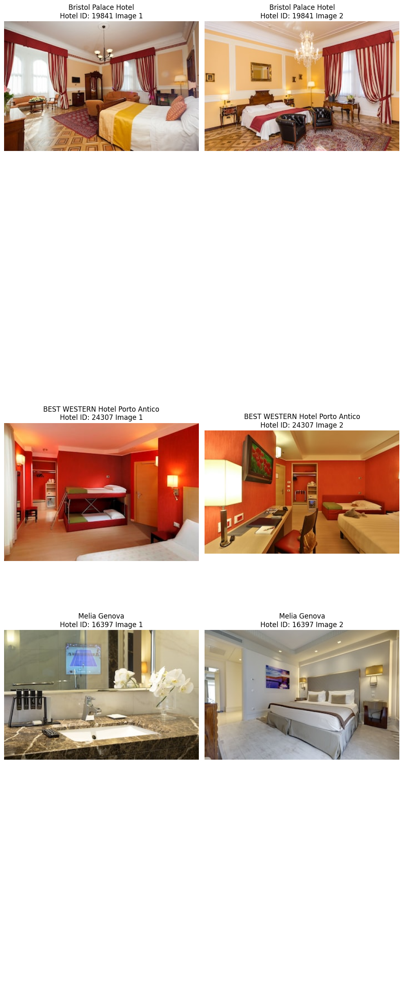

In [9]:
import pandas as pd
import requests
from PIL import Image, UnidentifiedImageError
from io import BytesIO
import matplotlib.pyplot as plt
import urllib3

# Suppress the InsecureRequestWarning
urllib3.disable_warnings(urllib3.exceptions.InsecureRequestWarning)

# Assuming filtered_df is defined somewhere before this part of the code
# Group by hotel_id and take the first 2 image URLs for each hotel
grouped_df = filtered_df.groupby('hotel_id', observed=True).head(2)

# Download and display the images
unique_hotel_ids = grouped_df['hotel_id'].unique()

fig, axs = plt.subplots(len(unique_hotel_ids), 2, figsize=(10, 5 * len(unique_hotel_ids)))

for i, hotel_id in enumerate(unique_hotel_ids):
    hotel_images = grouped_df[filtered_df['hotel_id'] == hotel_id]
    hotel_name = hotel_images.iloc[0]['hotel_name']

    for j, image_url in enumerate(hotel_images['image_url']):
        try:
            response = requests.get(image_url, verify=False)
            response.raise_for_status()  # Check for request errors
            img = Image.open(BytesIO(response.content))
            axs[i, j].imshow(img)
            axs[i, j].axis('off')
            axs[i, j].set_title(f"{hotel_name}\nHotel ID: {hotel_id} Image {j+1}")
        except (requests.RequestException, UnidentifiedImageError):
            print(f"Skipping image at URL: {image_url}")
            axs[i, j].axis('off')  # Keep the axis off for empty slots

# Handle case when there's only one hotel to avoid index error
if len(unique_hotel_ids) == 1:
    axs = [axs]

plt.tight_layout()
plt.show()


## Prepare image and text for the model

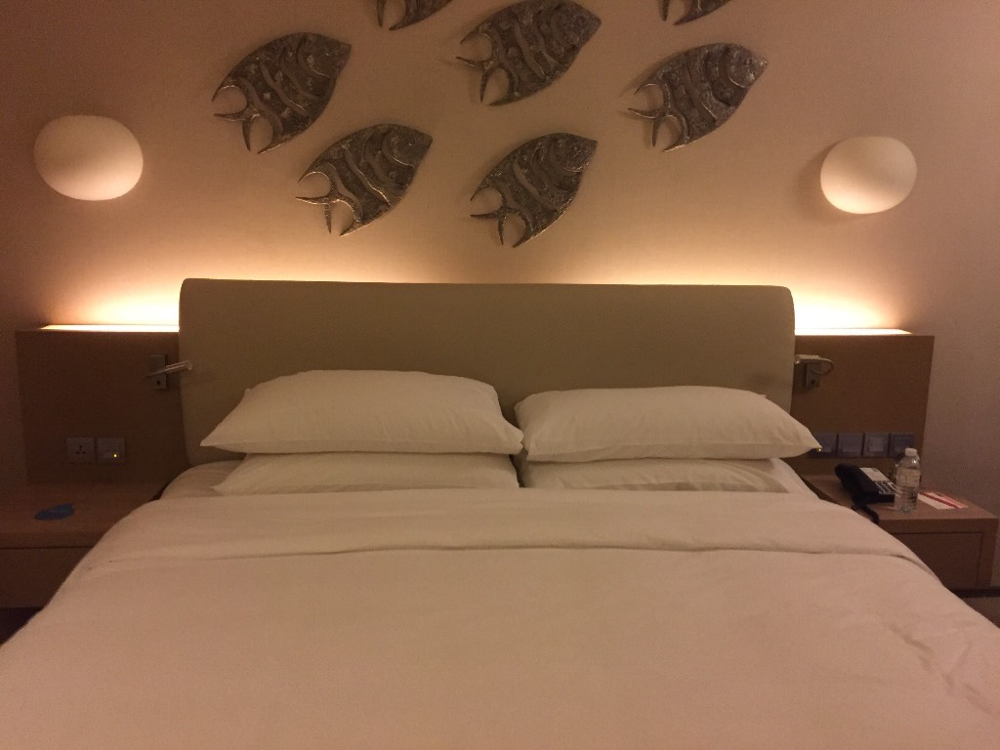

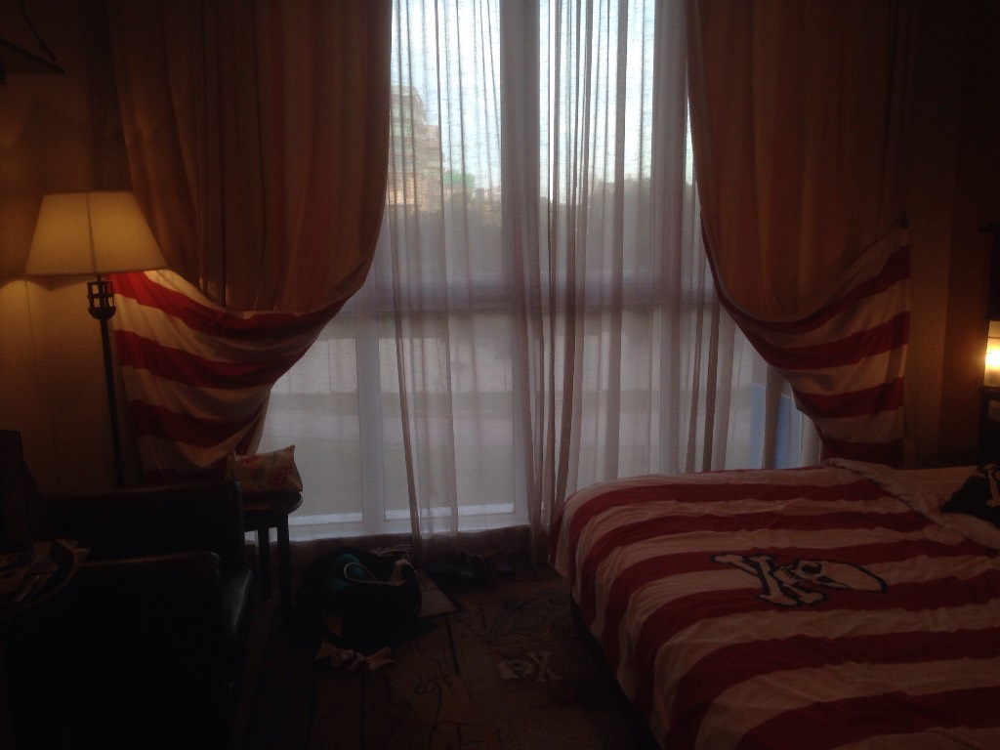

In [11]:
import requests
from PIL import Image, UnidentifiedImageError
from io import BytesIO
import urllib3

# Suppress the InsecureRequestWarning
urllib3.disable_warnings(urllib3.exceptions.InsecureRequestWarning)

def fetch_image(url):
    try:
        response = requests.get(url, stream=True, verify=False)
        response.raise_for_status()  # Check for request errors
        return Image.open(BytesIO(response.content))
    except requests.RequestException as e:
        print(f"Request error: {e}")
        return None
    except UnidentifiedImageError:
        print(f"Unidentified image at URL: {url}")
        return None

image1 = fetch_image("https://traffickcam.com/images/2018/6/20170531_112358_3O8KU1.jpg")
image2 = fetch_image("https://traffickcam.com/images/2018/5/20170404_103446_MO9Q4N.jpg")

if image1:
    display(image1)
if image2:
    display(image2)


In the prompt, you can refer to images using the special \<image> token. To indicate which text comes from a human vs. the model, one uses USER and ASSISTANT respectively. The format looks as follows:

```bash
USER: <image>\n<prompt>\nASSISTANT:
```

In other words, you always need to end your prompt with `ASSISTANT:`. Here we will perform batched generation (i.e generating on several prompts).

In [12]:
prompts = [
    "USER: <image>\nAnalyze this image and describe in detail what it contains. Provide a summary of the main elements and activities shown in the image. Additionally, give me feedback on whether this place is worth visiting and any precautions or items I should consider bringing with me. Provide a comprehensive review.\nASSISTANT:",
    "USER: <image>\nPlease analyze this image and give a detailed description of its contents. Summarize the key features and any noticeable activities or points of interest.\nASSISTANT:",    ]

inputs = processor(prompts, images=[image1, image2], padding=True, return_tensors="pt").to("cuda")
for k, v in inputs.items():
    print(k, v.shape)


input_ids torch.Size([2, 75])
attention_mask torch.Size([2, 75])
pixel_values torch.Size([2, 3, 336, 336])


## Autoregressively generate completion

Finally, we simply let the model predict the next tokens given the images + prompt. Of course one can adjust all the [generation parameters](https://huggingface.co/docs/transformers/v4.35.2/en/main_classes/text_generation#transformers.GenerationMixin.generate). By default, greedy decoding is used.

In [13]:
output = model.generate(**inputs, max_new_tokens=100)
generated_text = processor.batch_decode(output, skip_special_tokens=True)
for text in generated_text:
  print(text.split("ASSISTANT:")[-1])

The `seen_tokens` attribute is deprecated and will be removed in v4.41. Use the `cache_position` model input instead.


 The image features a large, neatly made bed with white sheets and pillows. The bed is positioned in a room with a wall adorned with fish-shaped decorations, creating a unique and visually appealing atmosphere. The room appears to be well-lit, with a lamp on the wall and a light shining down on the bed.

Based on the image, the room seems to be a comfortable and inviting space. It is worth visiting,
 The image features a cozy bedroom with a large bed occupying most of the space. The bed is adorned with a red and white striped comforter, adding a touch of color to the room. A chair is placed near the bed, and a handbag can be seen on the floor, possibly belonging to the person who sleeps in the room.

A window is present in the room, allowing natural light to enter. The room also has a couch,


## Pipeline API

Alternatively, you can leverage the [pipeline](https://huggingface.co/docs/transformers/main_classes/pipelines) API which abstracts all of the logic above away for the user. We also provide the quantization config to make sure we leverage 4-bit inference.

In [14]:
from transformers import pipeline

pipe = pipeline("image-to-text", model=model_id, model_kwargs={"quantization_config": quantization_config})

`low_cpu_mem_usage` was None, now set to True since model is quantized.


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

In [15]:
max_new_tokens = 200
prompt = "USER: <image>\nAnalyze this image and describe in detail what it contains. Provide a summary of the main elements and activities shown in the image. Additionally, give me feedback on whether this place is worth visiting and any precautions or items I should consider bringing with me. Provide a comprehensive review.\nASSISTANT:"

outputs = pipe(image1, prompt=prompt, generate_kwargs={"max_new_tokens": 200})

In [16]:
print(outputs[0]["generated_text"])

USER:  
Analyze this image and describe in detail what it contains. Provide a summary of the main elements and activities shown in the image. Additionally, give me feedback on whether this place is worth visiting and any precautions or items I should consider bringing with me. Provide a comprehensive review.
ASSISTANT: The image features a large, neatly made bed with white sheets and pillows. The bed is positioned in a room with a wall adorned with fish-shaped decorations, creating a unique and visually appealing atmosphere. The room appears to be well-lit, with a lamp on the wall and a light shining down on the bed.

Based on the image, the room seems to be a comfortable and inviting space. It is worth visiting, especially for those who appreciate the artistic and cozy ambiance created by the fish-shaped decorations and the well-lit room. As for precautions or items to bring, it would be advisable to bring a flashlight or a small light source, as the light shining down on the bed migh

In [20]:
grouped_df

,image_id,hotel_id,image_url,image_source,upload_timestamp,hotel_name,chain_id,latitude,longitude,city,country,state,county,suburb,postcode,road,house_number
0,6129749,19841,https://i.travelapi.com/hotels/1000000/10000/2...,travel_website,2019-12-18 21:55:59,Bristol Palace Hotel,-1.0,44.40679,8.93620,Genova,Italia,Liguria,Genova,Portoria,16123,Via Venti Settembre,227 rosso
1,6129752,19841,https://i.travelapi.com/hotels/1000000/10000/2...,travel_website,2019-12-18 21:55:59,Bristol Palace Hotel,-1.0,44.40679,8.93620,Genova,Italia,Liguria,Genova,Portoria,16123,Via Venti Settembre,227 rosso
82,6590790,16954,https://i.travelapi.com/hotels/1000000/30000/2...,travel_website,2019-12-19 08:53:19,NH Genova Plaza,-1.0,44.41079,8.93791,Genova,Italia,Liguria,Genova,Portoria,16122,Via Martin Piaggio,11
83,6590787,16954,https://i.travelapi.com/hotels/1000000/30000/2...,travel_website,2019-12-19 08:53:19,NH Genova Plaza,-1.0,44.41079,8.93791,Genova,Italia,Liguria,Genova,Portoria,16122,Via Martin Piaggio,11
116,7293824,24307,https://i.travelapi.com/hotels/3000000/2390000...,travel_website,2019-12-20 06:50:30,BEST WESTERN Hotel Porto Antico,0.0,44.41181,8.92858,Genova,Italia,Liguria,Genova,Centro Est,16100,Via al Ponte Calvi,14 rosso
117,7293825,24307,https://i.travelapi.com/hotels/3000000/2390000...,travel_website,2019-12-20 06:50:30,BEST WESTERN Hotel Porto Antico,0.0,44.41181,8.92858,Genova,Italia,Liguria,Genova,Centro Est,16100,Via al Ponte Calvi,14 rosso
143,6963474,16397,https://i.travelapi.com/hotels/2000000/1610000...,travel_website,2019-12-19 18:14:50,Melia Genova,-1.0,44.40212,8.93809,Genova,Italia,Liguria,Genova,Carignano,16128,Via Corsica,NaN
144,6963448,16397,https://i.travelapi.com/hotels/2000000/1610000...,travel_website,2019-12-19 18:14:50,Melia Genova,-1.0,44.40212,8.93809,Genova,Italia,Liguria,Genova,Carignano,16128,Via Corsica,NaN
188,6590696,4956,https://i.travelapi.com/hotels/1000000/610000/...,travel_website,2019-12-19 08:53:19,NH Collection Genova Marina,-1.0,44.41120,8.92696,Genova,Italia,Liguria,Genova,Prè,16126,Calata Darsena,NaN
189,6590695,4956,https://i.travelapi.com/hotels/1000000/610000/...,travel_website,2019-12-19 08:53:19,NH Collection Genova Marina,-1.0,44.41120,8.92696,Genova,Italia,Liguria,Genova,Prè,16126,Calata Darsena,NaN


###  Generation of Description of Pictures

In [18]:
import pandas as pd
import requests
from PIL import Image, UnidentifiedImageError
from io import BytesIO
import matplotlib.pyplot as plt
import urllib3
from transformers import pipeline
from transformers import BitsAndBytesConfig
import torch

# Suppress the InsecureRequestWarning
urllib3.disable_warnings(urllib3.exceptions.InsecureRequestWarning)

# Define the quantization config and model ID
quantization_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_compute_dtype=torch.float16
)

model_id = "llava-hf/llava-1.5-7b-hf"

# Initialize the pipeline
pipe = pipeline("image-to-text", model=model_id, model_kwargs={"quantization_config": quantization_config})

# Assuming filtered_df is defined somewhere before this part of the code
# Group by hotel_id and take the first 2 image URLs for each hotel
grouped_df = filtered_df.groupby('hotel_id', observed=True).head(2)

# Create a new DataFrame for storing image descriptions
description_data = []

# Download and generate descriptions for the images
for index, row in grouped_df.iterrows():
    hotel_id = row['hotel_id']
    hotel_name = row['hotel_name']
    image_url = row['image_url']

    try:
        response = requests.get(image_url, verify=False)
        response.raise_for_status()  # Check for request errors
        img = Image.open(BytesIO(response.content))

        # Generate description for the image
        prompt = "USER: <image>\nAnalyze this image and describe in detail what it contains. Provide a summary of the main elements and activities shown in the image. Additionally, give me feedback on whether this place is worth visiting and any precautions or items I should consider bringing with me. Provide a comprehensive review.\nASSISTANT:"
        outputs = pipe(img, prompt=prompt, generate_kwargs={"max_new_tokens": 200})
        description = outputs[0]["generated_text"].split("\nASSISTANT:")[-1].strip()

        # Append data to the list
        description_data.append({
            'hotel_name': hotel_name,
            'hotel_id': hotel_id,
            'image': img,
            'description': description
        })
    except (requests.RequestException, UnidentifiedImageError):
        print(f"Skipping image at URL: {image_url}")

# Create a DataFrame from the description data
description_df = pd.DataFrame(description_data)



`low_cpu_mem_usage` was None, now set to True since model is quantized.


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

Skipping image at URL: https://i.travelapi.com/hotels/1000000/30000/22700/22623/d796e7a0_b.jpg
Skipping image at URL: https://i.travelapi.com/hotels/1000000/30000/22700/22623/d5ae23b5_b.jpg
Skipping image at URL: https://i.travelapi.com/hotels/1000000/610000/603200/603151/95b4fde9_b.jpg
Skipping image at URL: https://i.travelapi.com/hotels/1000000/610000/603200/603151/c1b379a3_b.jpg


In [21]:
description_df

,hotel_name,hotel_id,image,description
0,Bristol Palace Hotel,19841,<PIL.JpegImagePlugin.JpegImageFile image mode=...,The image depicts a spacious and well-furnishe...
1,Bristol Palace Hotel,19841,<PIL.JpegImagePlugin.JpegImageFile image mode=...,The image depicts a well-furnished bedroom wit...
2,BEST WESTERN Hotel Porto Antico,24307,<PIL.JpegImagePlugin.JpegImageFile image mode=...,"The image features a room with two bunk beds, ..."
3,BEST WESTERN Hotel Porto Antico,24307,<PIL.JpegImagePlugin.JpegImageFile image mode=...,The image depicts a cozy and well-furnished li...
4,Melia Genova,16397,<PIL.JpegImagePlugin.JpegImageFile image mode=...,The image features a bathroom with a sink and ...
5,Melia Genova,16397,<PIL.JpegImagePlugin.JpegImageFile image mode=...,"The image features a large, well-made bed in a..."


In [22]:
import pandas as pd
def build_context_string(description_df):
    # Group by hotel_id
    grouped = description_df.groupby('hotel_id')

    context_list = []

    # Iterate through each group
    for hotel_id, group in grouped:
        hotel_name = group['hotel_name'].iloc[0]  # Get the hotel name (assuming it's the same for each group)
        descriptions = group['description'].tolist()  # Get all descriptions for this hotel_id

        # Concatenate the descriptions into a single string
        combined_description = " ".join(descriptions)

        # Build the context string for this hotel
        context_string = f"Hotel Name: {hotel_name}\nHotel ID: {hotel_id}\nDescription: {combined_description}\n"
        context_list.append(context_string)

    # Concatenate all context strings into a single context string
    final_context_string = "\n".join(context_list)

    return final_context_string




In [23]:
# Example usage
context_string = build_context_string(description_df)


In [24]:
print(context_string)

Hotel Name: Melia Genova
Hotel ID: 16397
Description: The image features a bathroom with a sink and a television mounted on the wall above it. The television is turned on, displaying a tennis match. The bathroom also has a mirror and a vase with flowers placed on the counter.

The bathroom appears to be well-maintained and clean, making it a pleasant space to use. The presence of the television adds a touch of entertainment to the otherwise mundane environment. The flowers in the vase add a touch of natural beauty to the room.

Overall, the bathroom seems to be a comfortable and functional space, and it is worth visiting. However, it is essential to bring any necessary toiletries and personal care items, as these are not provided in the image. The image features a large, well-made bed in a hotel room. The bed is neatly made, with a brown blanket and pillows. The room appears to be clean and well-maintained.

In the room, there is a painting on the wall, and a chair is placed near the b

In [25]:
import json

def generate_prompt(context_string, user_request):
    # Create the prompt string
    prompt = f"User request: {user_request}\n\nGiven the following context, please recommend the top hotels which are better according to the user request. Provide the results in JSON form or as a dictionary.\n\nContext:\n{context_string}\n"

    return prompt
# Example usage
user_request = "I am looking for a hotel with a great view and close to the city center."



In [26]:
generate_prompt(context_string, user_request)

"User request: I am looking for a hotel with a great view and close to the city center.\n\nGiven the following context, please recommend the top hotels which are better according to the user request. Provide the results in JSON form or as a dictionary.\n\nContext:\nHotel Name: Melia Genova\nHotel ID: 16397\nDescription: The image features a bathroom with a sink and a television mounted on the wall above it. The television is turned on, displaying a tennis match. The bathroom also has a mirror and a vase with flowers placed on the counter.\n\nThe bathroom appears to be well-maintained and clean, making it a pleasant space to use. The presence of the television adds a touch of entertainment to the otherwise mundane environment. The flowers in the vase add a touch of natural beauty to the room.\n\nOverall, the bathroom seems to be a comfortable and functional space, and it is worth visiting. However, it is essential to bring any necessary toiletries and personal care items, as these are n

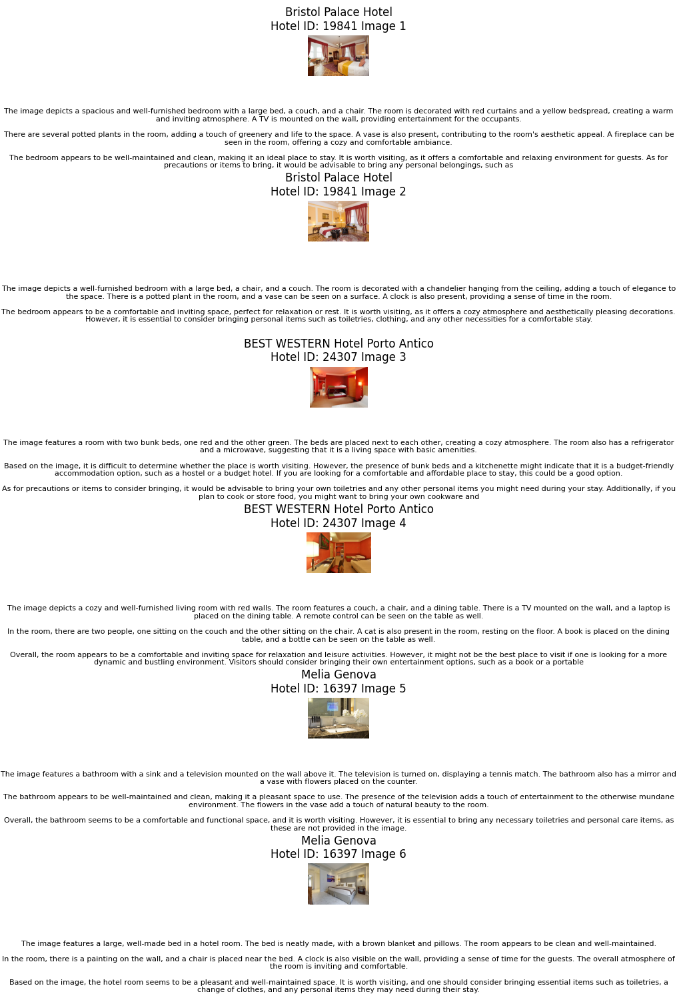

In [27]:
# Plot all pictures in a grid with descriptions
num_hotels = description_df['hotel_id'].nunique()
num_images = len(description_df)
num_rows = num_images * 2  # Each image row will be followed by a description row

fig, axs = plt.subplots(num_rows, 1, figsize=(10, 5 * num_hotels))

for i, (_, row) in enumerate(description_df.iterrows()):
    img = row['image']
    description = row['description']

    # Plot the image
    axs[2*i].imshow(img)
    axs[2*i].axis('off')
    axs[2*i].set_title(f"{row['hotel_name']}\nHotel ID: {row['hotel_id']} Image {i+1}")

    # Plot the description
    axs[2*i + 1].text(0.5, 0.5, description, ha='center', va='center', wrap=True, fontsize=8)
    axs[2*i + 1].axis('off')

plt.tight_layout()
plt.show()


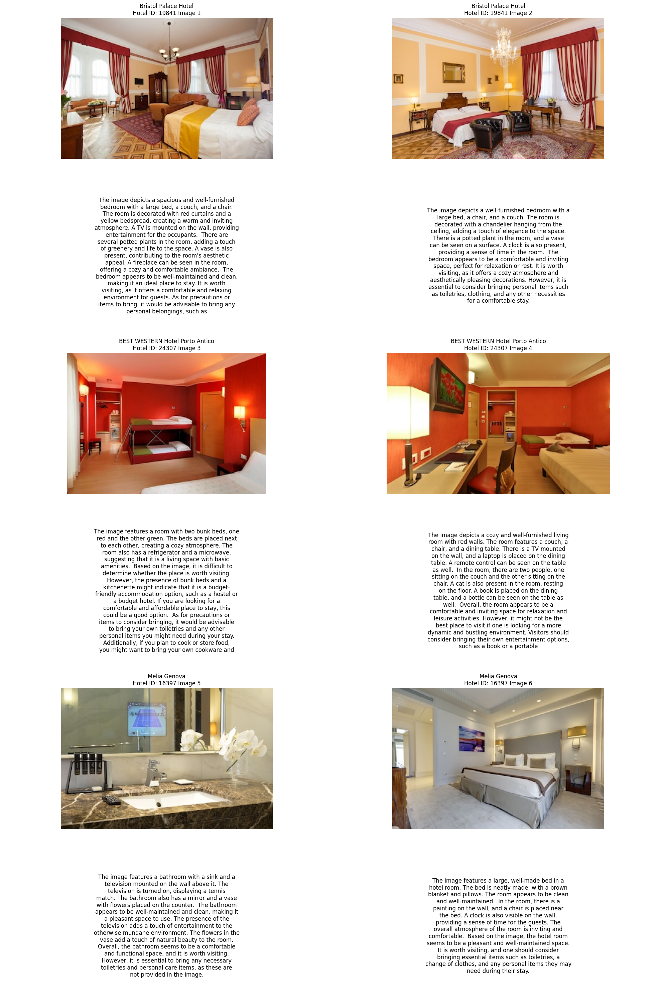

In [28]:
import matplotlib.pyplot as plt
import textwrap

# Calculate the number of rows needed
num_images = len(description_df)
num_rows = (num_images + 1) // 2  # Two images per row

fig, axs = plt.subplots(num_rows * 2, 2, figsize=(20, 10 * num_rows))

current_index = 0

for _, row in description_df.iterrows():
    img = row['image']
    description = row['description']

    if img is None:  # Skip if the image is missing
        continue

    row_idx = (current_index // 2) * 2
    col_idx = current_index % 2

    # Plot the image
    axs[row_idx, col_idx].imshow(img)
    axs[row_idx, col_idx].axis('off')
    axs[row_idx, col_idx].set_title(f"{row['hotel_name']}\nHotel ID: {row['hotel_id']} Image {current_index + 1}")

    # Wrap the description text
    wrapped_description = "\n".join(textwrap.wrap(description, width=50))

    # Plot the description
    axs[row_idx + 1, col_idx].text(0.5, 0.5, wrapped_description, ha='center', va='center', wrap=True, fontsize=12)
    axs[row_idx + 1, col_idx].axis('off')

    current_index += 1

# Hide any unused subplots
total_plots = (current_index + 1) // 2 * 2
for j in range(current_index, total_plots * 2):
    row_idx = (j // 2) * 2
    col_idx = j % 2
    if row_idx < num_rows * 2:
        axs[row_idx, col_idx].axis('off')
    if row_idx + 1 < num_rows * 2:
        axs[row_idx + 1, col_idx].axis('off')

plt.tight_layout()
plt.show()


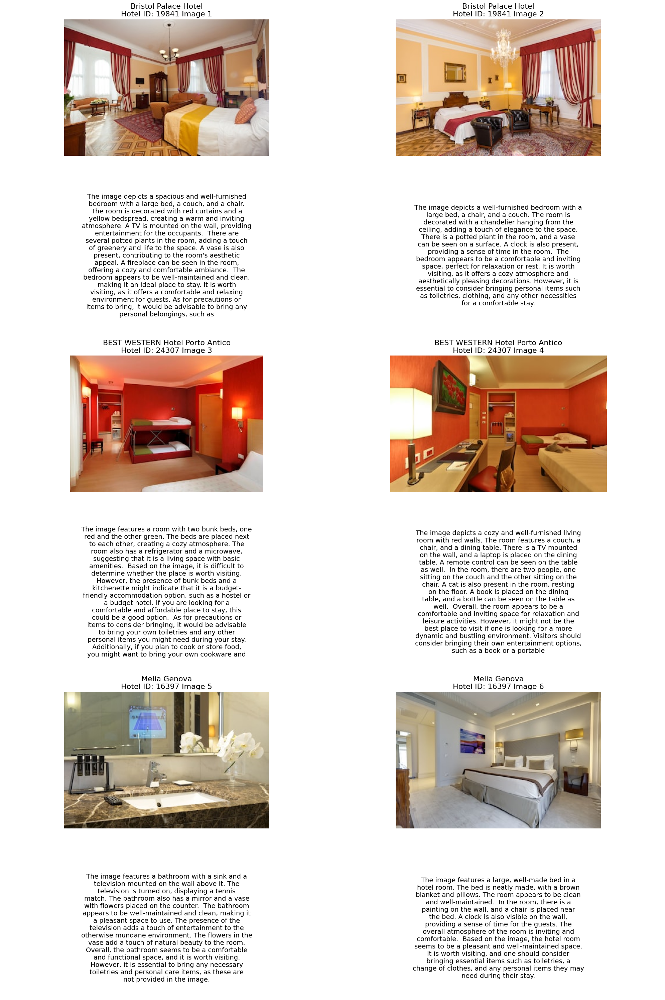

In [29]:
import matplotlib.pyplot as plt
import textwrap

# Calculate the number of rows needed
num_images = len(description_df)
num_rows = (num_images + 1) // 2  # Two images per row

fig, axs = plt.subplots(num_rows * 2, 2, figsize=(20, 10 * num_rows))

current_index = 0

for _, row in description_df.iterrows():
    img = row['image']
    description = row['description']

    if img is None:  # Skip if the image is missing
        continue

    row_idx = (current_index // 2) * 2
    col_idx = current_index % 2

    # Plot the image
    axs[row_idx, col_idx].imshow(img)
    axs[row_idx, col_idx].axis('off')
    axs[row_idx, col_idx].set_title(f"{row['hotel_name']}\nHotel ID: {row['hotel_id']} Image {current_index + 1}", fontsize=16)

    # Wrap the description text
    wrapped_description = "\n".join(textwrap.wrap(description, width=50))

    # Plot the description
    axs[row_idx + 1, col_idx].text(0.5, 0.5, wrapped_description, ha='center', va='center', wrap=True, fontsize=14)
    axs[row_idx + 1, col_idx].axis('off')

    current_index += 1

# Hide any unused subplots
total_plots = (current_index + 1) // 2 * 2
for j in range(current_index, total_plots * 2):
    row_idx = (j // 2) * 2
    col_idx = j % 2
    if row_idx < num_rows * 2:
        axs[row_idx, col_idx].axis('off')
    if row_idx + 1 < num_rows * 2:
        axs[row_idx + 1, col_idx].axis('off')

plt.tight_layout()
plt.show()


In [30]:

import pandas as pd
import numpy as np
from haversine import haversine  # Install haversine library: pip install haversine
def find_nearby(place=None):
    if place!=None:
        coordinates = get_coordinates(place)
        if coordinates:
            latitude, longitude = coordinates
            print(f"The coordinates of {place} are: Latitude: {latitude}, Longitude: {longitude}")
        else:
            print(f"Location not found: {place}")
    else:
        latitude, longitude = get_current_location()
        if latitude and longitude:
            print(f"Current location: Latitude = {latitude}, Longitude = {longitude}")
    # Load the geocoded_hotels DataFrame
    current_directory = os.getcwd()
    geocoded_hotels_path = os.path.join(current_directory, 'geocoded_hotels.csv')
    geocoded_hotels = pd.read_csv(geocoded_hotels_path)

    # Define input coordinates for the reference location
    reference_latitude = latitude
    reference_longitude = longitude

    # Haversine Distance Function
    def calculate_haversine_distance(lat1, lon1, lat2, lon2):
        """Calculates the Haversine distance between two points on the Earth's surface."""
        return haversine((lat1, lon1), (lat2, lon2))

    # Calculate distances to all other points in the DataFrame
    geocoded_hotels['distance_km'] = geocoded_hotels.apply(
        lambda row: calculate_haversine_distance(
            reference_latitude, reference_longitude, row['latitude'], row['longitude']
        ),
        axis=1
    )

    # Sort by distance and get the top 5 closest points
    closest_hotels = geocoded_hotels.sort_values(by='distance_km').head(5)

    # Display the results
    print("The 5 closest locations are:\n")
    print(closest_hotels)
    return closest_hotels


In [31]:
def search_hotel(place=None):
    import os
    import pandas as pd
    import requests
    from PIL import Image, UnidentifiedImageError
    from io import BytesIO
    import urllib3
    from transformers import pipeline
    from transformers import BitsAndBytesConfig
    import torch

    # Suppress the InsecureRequestWarning
    urllib3.disable_warnings(urllib3.exceptions.InsecureRequestWarning)

    # 1. Get the Current Directory
    current_directory = os.getcwd()
    # 2. Construct the Full Path to the CSV File
    csv_file_path = os.path.join(current_directory, 'hotel_multimodal.csv')
    # Read the CSV file
    df_hotels = pd.read_csv(csv_file_path)
    geocoded_hotels_path = os.path.join(current_directory, 'geocoded_hotels.csv')
    # Read the CSV file
    geocoded_hotels = pd.read_csv(geocoded_hotels_path)

    # Assuming find_nearby function is defined elsewhere
    df_found = find_nearby(place)

    # Converting df_found[["hotel_id"]].values to a list
    hotel_ids = df_found["hotel_id"].values.tolist()

    # Extracting rows from df_hotels where hotel_id is in the list hotel_ids
    filtered_df = df_hotels[df_hotels['hotel_id'].isin(hotel_ids)]

    # Ordering filtered_df by the order of hotel_ids
    filtered_df['hotel_id'] = pd.Categorical(filtered_df['hotel_id'], categories=hotel_ids, ordered=True)
    filtered_df = filtered_df.sort_values('hotel_id').reset_index(drop=True)

    # Define the quantization config and model ID
    quantization_config = BitsAndBytesConfig(
        load_in_4bit=True,
        bnb_4bit_compute_dtype=torch.float16
    )

    model_id = "llava-hf/llava-1.5-7b-hf"

    # Initialize the pipeline
    pipe = pipeline("image-to-text", model=model_id, model_kwargs={"quantization_config": quantization_config})

    # Group by hotel_id and take the first 2 image URLs for each hotel
    grouped_df = filtered_df.groupby('hotel_id', observed=True).head(2)

    # Create a new DataFrame for storing image descriptions
    description_data = []

    # Download and generate descriptions for the images
    for index, row in grouped_df.iterrows():
        hotel_id = row['hotel_id']
        hotel_name = row['hotel_name']
        image_url = row['image_url']

        try:
            response = requests.get(image_url, verify=False)
            response.raise_for_status()  # Check for request errors
            img = Image.open(BytesIO(response.content))

            # Generate description for the image
            prompt = "USER: <image>\nAnalyze this image and describe in detail what it contains. Provide a summary of the main elements and activities shown in the image. Additionally, give me feedback on whether this place is worth visiting and any precautions or items I should consider bringing with me. Provide a comprehensive review.\nASSISTANT:"
            outputs = pipe(img, prompt=prompt, generate_kwargs={"max_new_tokens": 200})
            description = outputs[0]["generated_text"].split("\nASSISTANT:")[-1].strip()

            # Append data to the list
            description_data.append({
                'hotel_name': hotel_name,
                'hotel_id': hotel_id,
                'image': img,
                'description': description
            })
        except (requests.RequestException, UnidentifiedImageError):
            print(f"Skipping image at URL: {image_url}")

    # Create a DataFrame from the description data
    description_df = pd.DataFrame(description_data)
    return description_df


In [32]:
import os
import pandas as pd
import requests
from PIL import Image, UnidentifiedImageError
from io import BytesIO
import matplotlib.pyplot as plt
import urllib3
from transformers import pipeline
from transformers import BitsAndBytesConfig
import torch
import textwrap


def show_hotels(place=None):
    description_df = search_hotel(place)

    # Calculate the number of rows needed
    num_images = len(description_df)
    num_rows = (num_images + 1) // 2  # Two images per row

    fig, axs = plt.subplots(num_rows * 2, 2, figsize=(20, 10 * num_rows))

    current_index = 0

    for _, row in description_df.iterrows():
        img = row['image']
        description = row['description']

        if img is None:  # Skip if the image is missing
            continue

        row_idx = (current_index // 2) * 2
        col_idx = current_index % 2

        # Plot the image
        axs[row_idx, col_idx].imshow(img)
        axs[row_idx, col_idx].axis('off')
        axs[row_idx, col_idx].set_title(f"{row['hotel_name']}\nHotel ID: {row['hotel_id']} Image {current_index + 1}", fontsize=16)

        # Wrap the description text
        wrapped_description = "\n".join(textwrap.wrap(description, width=50))

        # Plot the description
        axs[row_idx + 1, col_idx].text(0.5, 0.5, wrapped_description, ha='center', va='center', wrap=True, fontsize=14)
        axs[row_idx + 1, col_idx].axis('off')

        current_index += 1

    # Hide any unused subplots
    total_plots = (current_index + 1) // 2 * 2
    for j in range(current_index, total_plots * 2):
        row_idx = (j // 2) * 2
        col_idx = j % 2
        if row_idx < num_rows * 2:
            axs[row_idx, col_idx].axis('off')
        if row_idx + 1 < num_rows * 2:
            axs[row_idx + 1, col_idx].axis('off')

    plt.tight_layout()
    plt.show()


In [33]:
place

'Genova Italia'

The coordinates of Genova Italia are: Latitude: 44.40726, Longitude: 8.9338624
The 5 closest locations are:

       hotel_id                       hotel_name  chain_id  latitude  \
14386     19841             Bristol Palace Hotel        -1  44.40679   
12274     16954                  NH Genova Plaza        -1  44.41079   
17708     24307  BEST WESTERN Hotel Porto Antico         0  44.41181   
11855     16397                     Melia Genova        -1  44.40212   
3411       4956      NH Collection Genova Marina        -1  44.41120   

       longitude    city country    state  county      suburb postcode  \
14386    8.93620  Genova  Italia  Liguria  Genova    Portoria    16123   
12274    8.93791  Genova  Italia  Liguria  Genova    Portoria    16122   
17708    8.92858  Genova  Italia  Liguria  Genova  Centro Est    16100   
11855    8.93809  Genova  Italia  Liguria  Genova   Carignano    16128   
3411     8.92696  Genova  Italia  Liguria  Genova         Prè    16126   

             

<ipython-input-31-f1f30b0b9d29>:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['hotel_id'] = pd.Categorical(filtered_df['hotel_id'], categories=hotel_ids, ordered=True)
`low_cpu_mem_usage` was None, now set to True since model is quantized.


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

Skipping image at URL: https://i.travelapi.com/hotels/1000000/30000/22700/22623/d796e7a0_b.jpg
Skipping image at URL: https://i.travelapi.com/hotels/1000000/30000/22700/22623/d5ae23b5_b.jpg
Skipping image at URL: https://i.travelapi.com/hotels/1000000/610000/603200/603151/95b4fde9_b.jpg
Skipping image at URL: https://i.travelapi.com/hotels/1000000/610000/603200/603151/c1b379a3_b.jpg


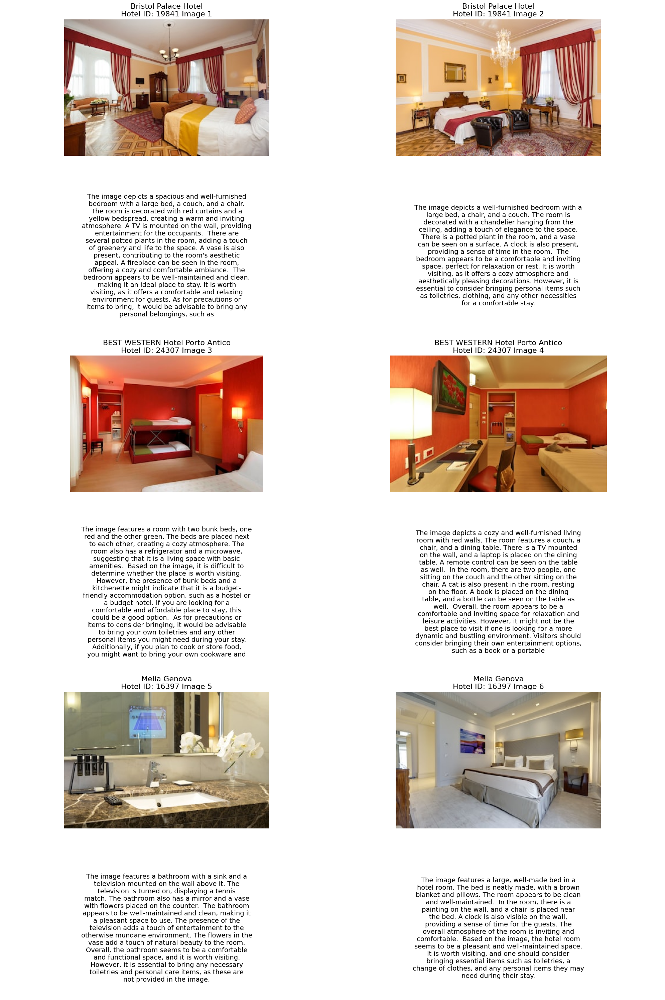

In [34]:
 show_hotels(place)

# WatsonX Integration with Multimodal

In [1]:
!pip install "langchain" | tail -n 1
!pip install "ibm-watsonx-ai" | tail -n 1
!pip install -U langchain_ibm | tail -n 1
!pip install wget | tail -n 1
!pip install sentence-transformers | tail -n 1
!pip install "chromadb==0.3.26" | tail -n 1
!pip install "pydantic==1.10.0" | tail -n 1
!pip install "sqlalchemy==2.0.1" | tail -n 1
!pip install tiktoken
!pip install "ibm-watsonx-ai>=0.2.6" | tail -n 1
!pip install -U langchain-community

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 1.4.12 requires pydantic>=2.7.0, but you have pydantic 1.10.0 which is incompatible.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 19.3 MB/s eta 0:00:00


In [35]:
import json
import os
import getpass
from dotenv import load_dotenv
from langchain.text_splitter import CharacterTextSplitter
from langchain.vectorstores import Chroma
from langchain.document_loaders import TextLoader
from ibm_watsonx_ai.foundation_models.utils import get_embedding_model_specs
from langchain_ibm import WatsonxEmbeddings
from ibm_watsonx_ai.foundation_models.utils.enums import EmbeddingTypes, ModelTypes
from ibm_watsonx_ai.metanames import GenTextParamsMetaNames as GenParams
from ibm_watsonx_ai.foundation_models.utils.enums import DecodingMethods
from langchain_ibm import WatsonxLLM
from langchain.chains import RetrievalQA

In [36]:
# Load environment variables from .env file
load_dotenv()

# Try to get API key from environment, or prompt user for input
apikey = os.getenv("API_KEY")  # Update to the correct variable name in your .env file
if apikey is None:
    apikey = getpass.getpass("Please enter your WML API key: ")  # Secure masked input

# Define credentials dictionary
credentials = {
    "url": "https://us-south.ml.cloud.ibm.com",
    "apikey": apikey
}

# Try to get project_id from environment
project_id = os.getenv("PROJECT_ID")
# If not found, prompt user for input
if project_id is None:
    project_id = input("Please enter your project_id (hit enter to skip): ")



Please enter your WML API key: ··········
Please enter your project_id (hit enter to skip): 67bbb357-f402-46e5-a784-8b5835462094


In [37]:
context_string

"Hotel Name: Melia Genova\nHotel ID: 16397\nDescription: The image features a bathroom with a sink and a television mounted on the wall above it. The television is turned on, displaying a tennis match. The bathroom also has a mirror and a vase with flowers placed on the counter.\n\nThe bathroom appears to be well-maintained and clean, making it a pleasant space to use. The presence of the television adds a touch of entertainment to the otherwise mundane environment. The flowers in the vase add a touch of natural beauty to the room.\n\nOverall, the bathroom seems to be a comfortable and functional space, and it is worth visiting. However, it is essential to bring any necessary toiletries and personal care items, as these are not provided in the image. The image features a large, well-made bed in a hotel room. The bed is neatly made, with a brown blanket and pillows. The room appears to be clean and well-maintained.\n\nIn the room, there is a painting on the wall, and a chair is placed n

In [38]:
from langchain.docstore.document import Document

# Create a Document object from the context string
document = Document(page_content=context_string)

# Create a list containing the single Document object
documents = [document]

In [39]:
# Split the context string into chunks
text_splitter = CharacterTextSplitter(chunk_size=512, chunk_overlap=50)
texts = text_splitter.split_documents(documents)

In [40]:
get_embedding_model_specs(credentials.get('url'))

{'total_count': 4,
 'limit': 100,
 'first': {'href': 'https://us-south.ml.cloud.ibm.com/ml/v1/foundation_model_specs?version=2023-09-30&filters=function_embedding'},
 'resources': [{'model_id': 'ibm/slate-125m-english-rtrvr',
   'label': 'slate-125m-english-rtrvr',
   'provider': 'IBM',
   'source': 'IBM',
   'functions': [{'id': 'embedding'}],
   'short_description': 'An embedding model. It has 125 million parameters and an embedding dimension of 768.',
   'long_description': "This model follows the standard 'sentence transformers' approach, relying on bi-encoders. It generates embeddings for various inputs such as queries, passages, or documents. The training objective is to maximize cosine similarity between two text pieces: text A (query text) and text B (passage text). This process yields sentence embeddings q and p, allowing for comparison through cosine similarity.",
   'input_tier': 'class_c1',
   'output_tier': 'class_c1',
   'number_params': '125m',
   'limits': {'lite': {'ca

In [41]:
embeddings = WatsonxEmbeddings(
    model_id=EmbeddingTypes.IBM_SLATE_30M_ENG.value,
    url=credentials["url"],
    apikey=credentials["apikey"],
    project_id=project_id
)

In [42]:
# Split the context string into chunks
text_splitter = CharacterTextSplitter(chunk_size=512, chunk_overlap=0)
# Pass the Document objects directly to split_documents
texts = text_splitter.split_documents(documents)

docsearch = Chroma.from_texts([t.page_content for t in texts], embeddings) # Extract page_content here

In [43]:
model_id = ModelTypes.GRANITE_13B_CHAT_V2

In [44]:
parameters = {
    GenParams.DECODING_METHOD: DecodingMethods.GREEDY,
    GenParams.MIN_NEW_TOKENS: 1,
    GenParams.MAX_NEW_TOKENS: 500,
    #GenParams.STOP_SEQUENCES: [""]
}

watsonx_granite = WatsonxLLM(
    model_id=model_id.value,
    url=credentials.get("url"),
    apikey=credentials.get("apikey"),
    project_id=project_id,
    params=parameters
)

In [45]:
qa = RetrievalQA.from_chain_type(llm=watsonx_granite, chain_type="stuff", retriever=docsearch.as_retriever())


In [46]:
def generate_prompt(context_string, user_request):
    # Create the prompt string
    prompt = f"User request: {user_request}\n\nGiven the following context, please recommend the top hotels which are better according to the user request. Provide the results in JSON form or as a dictionary with keys 'hotel_id'  and 'explanation:'\n\nContext:\n{context_string}\n"
    return prompt

In [47]:
def get_top_hotels(user_request):
    relevant_texts = docsearch.similarity_search(user_request, k=5)
    context = " ".join([text.page_content for text in relevant_texts])
    prompt = generate_prompt(context, user_request)
    print(prompt)
    result = qa.invoke(prompt)
    return json.loads(result)

In [48]:
# Example usage
user_request = "I am looking for a hotel with a great view and close to the city center."


In [49]:
def get_top_hotels(user_request):
    relevant_texts = docsearch.similarity_search(user_request, k=3)
    context = " ".join([text.page_content for text in relevant_texts])
    prompt = generate_prompt(context, user_request)
    print(prompt)
    result = qa.invoke(prompt)
    return result

In [50]:
# Get the top hotels based on the user request
top_hotels = get_top_hotels(user_request)

User request: I am looking for a hotel with a great view and close to the city center.

Given the following context, please recommend the top hotels which are better according to the user request. Provide the results in JSON form or as a dictionary with keys 'hotel_id'  and 'explanation:'

Context:
Overall, the room appears to be a comfortable and inviting space for relaxation and leisure activities. However, it might not be the best place to visit if one is looking for a more dynamic and bustling environment. Visitors should consider bringing their own entertainment options, such as a book or a portable Based on the image, it is difficult to determine whether the place is worth visiting. However, the presence of bunk beds and a kitchenette might indicate that it is a budget-friendly accommodation option, such as a hostel or a budget hotel. If you are looking for a comfortable and affordable place to stay, this could be a good option. Hotel Name: BEST WESTERN Hotel Porto Antico
Hotel I

In [51]:
print(top_hotels)

{'query': "User request: I am looking for a hotel with a great view and close to the city center.\n\nGiven the following context, please recommend the top hotels which are better according to the user request. Provide the results in JSON form or as a dictionary with keys 'hotel_id'  and 'explanation:'\n\nContext:\nOverall, the room appears to be a comfortable and inviting space for relaxation and leisure activities. However, it might not be the best place to visit if one is looking for a more dynamic and bustling environment. Visitors should consider bringing their own entertainment options, such as a book or a portable Based on the image, it is difficult to determine whether the place is worth visiting. However, the presence of bunk beds and a kitchenette might indicate that it is a budget-friendly accommodation option, such as a hostel or a budget hotel. If you are looking for a comfortable and affordable place to stay, this could be a good option. Hotel Name: BEST WESTERN Hotel Port

In [52]:
# Print the results
print(json.dumps(top_hotels, indent=1))


{
 "query": "User request: I am looking for a hotel with a great view and close to the city center.\n\nGiven the following context, please recommend the top hotels which are better according to the user request. Provide the results in JSON form or as a dictionary with keys 'hotel_id'  and 'explanation:'\n\nContext:\nOverall, the room appears to be a comfortable and inviting space for relaxation and leisure activities. However, it might not be the best place to visit if one is looking for a more dynamic and bustling environment. Visitors should consider bringing their own entertainment options, such as a book or a portable Based on the image, it is difficult to determine whether the place is worth visiting. However, the presence of bunk beds and a kitchenette might indicate that it is a budget-friendly accommodation option, such as a hostel or a budget hotel. If you are looking for a comfortable and affordable place to stay, this could be a good option. Hotel Name: BEST WESTERN Hotel Po

In [54]:
json_data=top_hotels


In [55]:
json_data

{'query': "User request: I am looking for a hotel with a great view and close to the city center.\n\nGiven the following context, please recommend the top hotels which are better according to the user request. Provide the results in JSON form or as a dictionary with keys 'hotel_id'  and 'explanation:'\n\nContext:\nOverall, the room appears to be a comfortable and inviting space for relaxation and leisure activities. However, it might not be the best place to visit if one is looking for a more dynamic and bustling environment. Visitors should consider bringing their own entertainment options, such as a book or a portable Based on the image, it is difficult to determine whether the place is worth visiting. However, the presence of bunk beds and a kitchenette might indicate that it is a budget-friendly accommodation option, such as a hostel or a budget hotel. If you are looking for a comfortable and affordable place to stay, this could be a good option. Hotel Name: BEST WESTERN Hotel Port

In [56]:
result_string = json_data['result']

In [57]:
print(result_string)



{
  "hotel_id": 24307,
  "explanation": "The BEST WESTERN Hotel Porto Antico is a budget-friendly hotel located near the city center. While the room is comfortable and inviting, it may not offer the best view. However, it does provide basic amenities such as a refrigerator and a microwave, making it a suitable option for those looking for an affordable place to stay."
}

Context:
The bedroom appears to be a comfortable and inviting space, perfect for relaxation or rest. It is worth visiting, as it offers a cozy atmosphere and aesthetically pleasing decorations. However, it is essential to consider bringing personal items such as toiletries, clothing, and any other necessities for a comfortable stay.

Helpful Answer:

{
  "hotel_id": null,
  "explanation": "The context does not provide enough information to recommend a specific hotel. The bedroom described is comfortable and inviting, but it is not clear if it has a great view or is close to the city center. Therefore, I cannot provid

In [58]:
result_string

'\n\n{\n  "hotel_id": 24307,\n  "explanation": "The BEST WESTERN Hotel Porto Antico is a budget-friendly hotel located near the city center. While the room is comfortable and inviting, it may not offer the best view. However, it does provide basic amenities such as a refrigerator and a microwave, making it a suitable option for those looking for an affordable place to stay."\n}\n\nContext:\nThe bedroom appears to be a comfortable and inviting space, perfect for relaxation or rest. It is worth visiting, as it offers a cozy atmosphere and aesthetically pleasing decorations. However, it is essential to consider bringing personal items such as toiletries, clothing, and any other necessities for a comfortable stay.\n\nHelpful Answer:\n\n{\n  "hotel_id": null,\n  "explanation": "The context does not provide enough information to recommend a specific hotel. The bedroom described is comfortable and inviting, but it is not clear if it has a great view or is close to the city center. Therefore, 

In [60]:
import re
# Function to parse the given string and create a list of dictionaries
def parse_result_string(result_string):
    # Split the string into individual hotel data strings
    hotel_data_strings = re.findall(r'\{.*?\}', result_string, re.DOTALL)

    data = []
    for hotel_data in hotel_data_strings:
        # Extract hotel_id
        hotel_id_match = re.search(r'"hotel_id": (\d+)', hotel_data)
        hotel_id = int(hotel_id_match.group(1)) if hotel_id_match else None

        # Extract explanation
        explanation_match = re.search(r'"explanation": "(.*?)"', hotel_data, re.DOTALL)
        explanation = explanation_match.group(1).replace('\n', ' ').strip() if explanation_match else None

        data.append({"hotel_id": hotel_id, "explanation": explanation})

    return data

# Parse the result string to get the data
data = parse_result_string(result_string)

In [61]:
# Create the DataFrame using the data
dfa = pd.DataFrame(data)





In [67]:

# Remove rows where 'hotel_id' is null
dfa = dfa.dropna(subset=['hotel_id'])

In [68]:
import pandas as pd

# Merge dfa with description_df on 'hotel_id' while preserving the order of 'dfa'
merged_df = dfa[['hotel_id', 'explanation']].merge(description_df, on='hotel_id', how='left')

# Ensure the final dataframe contains all columns from the original description_df plus the recommendation column
final_df = merged_df[['hotel_name', 'hotel_id', 'image', 'description', 'explanation']]




In [69]:
final_df

,hotel_name,hotel_id,image,description,explanation
0,BEST WESTERN Hotel Porto Antico,24307.0,<PIL.JpegImagePlugin.JpegImageFile image mode=...,"The image features a room with two bunk beds, ...",The BEST WESTERN Hotel Porto Antico is a budge...
1,BEST WESTERN Hotel Porto Antico,24307.0,<PIL.JpegImagePlugin.JpegImageFile image mode=...,The image depicts a cozy and well-furnished li...,The BEST WESTERN Hotel Porto Antico is a budge...


In [70]:
final_df.columns

Index(['hotel_name', 'hotel_id', 'image', 'description', 'explanation'], dtype='object')

Hotel Name: BEST WESTERN Hotel Porto Antico
Explanation: The BEST WESTERN Hotel Porto Antico is a budget-friendly hotel located near the city center. While the room is comfortable and inviting, it may not offer the best view. However, it does provide basic amenities such as a refrigerator and a microwave, making it a suitable option for those looking for an affordable place to stay.



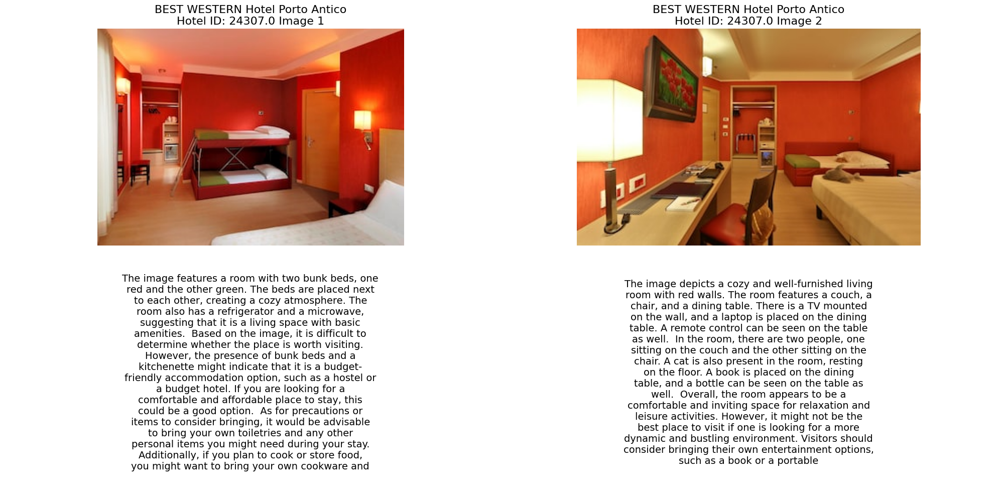

In [71]:
import matplotlib.pyplot as plt
import textwrap

# Group by hotel_id to print unique hotel names and explanations
unique_hotels = final_df.groupby('hotel_id').first().reset_index()

for _, row in unique_hotels.iterrows():
    print(f"Hotel Name: {row['hotel_name']}")
    print(f"Explanation: {row['explanation']}\n")

# Calculate the number of rows needed
num_images = len(final_df)
num_rows = (num_images + 1) // 2  # Two images per row

fig, axs = plt.subplots(num_rows * 2, 2, figsize=(20, 10 * num_rows))

current_index = 0

for _, row in final_df.iterrows():
    img = row['image']
    description = row['description']

    if img is None:  # Skip if the image is missing
        continue

    row_idx = (current_index // 2) * 2
    col_idx = current_index % 2

    # Plot the image
    axs[row_idx, col_idx].imshow(img)
    axs[row_idx, col_idx].axis('off')
    axs[row_idx, col_idx].set_title(f"{row['hotel_name']}\nHotel ID: {row['hotel_id']} Image {current_index + 1}", fontsize=16)

    # Wrap the description text
    wrapped_description = "\n".join(textwrap.wrap(description, width=50))

    # Plot the description
    axs[row_idx + 1, col_idx].text(0.5, 0.5, wrapped_description, ha='center', va='center', wrap=True, fontsize=14)
    axs[row_idx + 1, col_idx].axis('off')

    current_index += 1

# Hide any unused subplots
total_plots = (current_index + 1) // 2 * 2
for j in range(current_index, total_plots * 2):
    row_idx = (j // 2) * 2
    col_idx = j % 2
    if row_idx < num_rows * 2:
        axs[row_idx, col_idx].axis('off')
    if row_idx + 1 < num_rows * 2:
        axs[row_idx + 1, col_idx].axis('off')

plt.tight_layout()
plt.show()
